In [14]:
import pandas as pd
from bertopic import BERTopic
from bertopic.representation import KeyBERTInspired
from umap import UMAP
import os
import plotly.express as px
# import itertools
# import rapidfuzz
import numpy as np
# from scipy.stats import pointbiserialr
import matplotlib.pyplot as plt
from sentence_transformers import SentenceTransformer
# import spacy
# import torch
# import os
# from wordcloud import WordCloud
from cuml import UMAP as cumlUMAP



In [15]:
df_sejm_bertopic_annotated = pd.read_csv('./bertopic_results/sejm/sejm_bertopic_annotated.csv')

In [16]:
df_sejm_bertopic_annotated.head(100)

,date,author,text_all,place,TextBlob_Subjectivity,TextBlob_Polarity,sentiment_herbert,openai_result,text_part,sentiment,topic,is_outlier,detected_topic
0,2019-11-12,prezydent rzeczypospolitej polskiej andrzej duda,drodzy rodacy! wielce szanowny panie marszałku...,sejm,0.0000,0.000000,1,NaN,NaN,NaN,NaN,True,1
1,2019-11-12,senior antoni macierewicz,bardzo dziękuję panu prezydentowi za tak istot...,sejm,0.0625,-0.062500,1,NaN,NaN,NaN,NaN,True,1
3,2019-11-12,daniel milewski,poseł antoni macierewicz. dziękuję bardzo. pro...,sejm,0.0000,0.000000,1,NaN,NaN,NaN,NaN,True,1
27,2019-11-12,marzena machałek,dziękuję. panie marszałku! wysoka izbo! panie ...,sejm,0.0000,0.000000,1,NaN,NaN,NaN,NaN,True,1
28,2019-11-12,senior antoni macierewicz,"bardzo dziękuję, pani poseł. zanim przejdziemy...",sejm,0.0000,0.000000,0,NaN,NaN,NaN,NaN,True,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1111,2019-11-19,prezes rady ministrów mateusz morawiecki,pani marszałek! wysoka izbo! bardzo dziękuję z...,sejm,0.1925,0.103359,1,NaN,NaN,NaN,NaN,True,0
1112,2019-11-19,marszałek sejmu,dziękuję panu premierowi. zamykam dyskusję. do...,sejm,0.0000,0.000000,1,NaN,NaN,NaN,NaN,False,0
1138,2019-11-19,marek suski,pani marszałek! w związku z tym wnioskiem form...,sejm,0.0000,0.000000,0,NaN,NaN,NaN,NaN,True,0
1139,2019-11-19,marszałek sejmu,"panie pośle, dziękuję bardzo. ale to nieprawda...",sejm,0.0000,0.000000,0,NaN,NaN,NaN,NaN,True,0


Number of speeches with topic 0: 314511 (61.49%)
Sample of speeches:
	11 listopada zostałam zaatakowana przez osoby, które brały udział w marszu niepodległości. byłam lżona, opluwana przy policjantach. żaden policjant nie zareagował wtedy, gdy byłam wyzywana od „ch”, od „k” i od innych.
	panie ministrze, dziękuję za tę deklarację, że te środki się znajdą dla tych gmin i na ten fundusz, ale ja bym tak troszeczkę starał się schłodzić tę atmosferę, że aż połowę tego funduszu – pan mówi 2 mld zł – trafi dodatkowo na śląsk. proszę mi powiedzieć, ile kosztuje ta transformacja na śląsku, likwidacja dwunastu kopalń, likwidacja 500 tys. miejsc pracy związanych z branżą górniczą i z otoczeniem górniczym. bo mówię o takim zjawisku. pan oczywiście podaje pierwotny klucz podziału środków, które zostały już wskazane dla województwa śląskiego, mówiąc, że jesteśmy na którymś tam miejscu, że województwo się rozwija, w związku z tym te środki są w takim kluczu dzielone. a nikt nie mówi, że budżet to jes

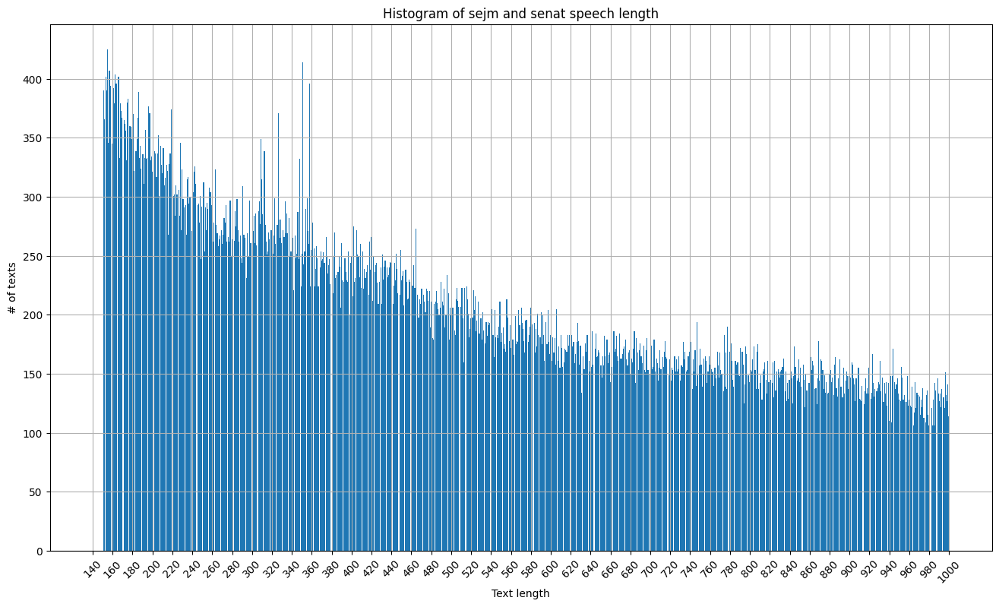

In [17]:
df_sejm_topic0_annotated = df_sejm_bertopic_annotated[df_sejm_bertopic_annotated.detected_topic == 0]

print(f'Number of speeches with topic 0: {len(df_sejm_topic0_annotated)} ({100*len(df_sejm_topic0_annotated)/len(df_sejm_bertopic_annotated):.2f}%)')
print('Sample of speeches:')
for line in df_sejm_topic0_annotated.text_all.sample(20):
    print(f'\t{line}')


fig, ax = plt.subplots()
max_range=1000
df_sejm_topic0_annotated.text_all.str.len().hist(range=(140, max_range), bins=max_range, ax=ax)
ax.set_title('Histogram of sejm and senat speech length')
ax.set_ylabel('# of texts')
ax.set_xlabel('Text length')
ax.set_xticks(range(140, max_range+1, 20))
ax.set_xticklabels(range(140, max_range+1, 20), rotation=45)
fig.set_size_inches(16, 9)

In [18]:
embedding_model='paraphrase-multilingual-MiniLM-L12-v2'
sentence_model = SentenceTransformer(embedding_model, device='cuda')
if not ('embeddings' in locals()):
    if (os.path.exists('./bertopic_results/sejm_topic0/sejm_text_embeddings.npy')):
        embeddings = np.load('./bertopic_results/sejm_topic0/sejm_text_embeddings.npy')
    else:
        embeddings: np.ndarray = sentence_model.encode(df_sejm_topic0_annotated.text_all.to_numpy(), show_progress_bar=True, batch_size=128)
        np.save('./bertopic_results/sejm_topic0/sejm_text_embeddings.npy', embeddings)

In [19]:
representation_model = KeyBERTInspired(random_state=42)
calculate_probabilities = True # get document's topic probs for each detected topic, not just the predicted one
umap_model = cumlUMAP(n_neighbors=10, n_components=5, min_dist=0.0, metric='cosine', random_state=42, verbose=True)
nr_topics: int | str = 50

if not os.path.exists('./bertopic_results/sejm_topic0/model/topic_embeddings.bin'):
    topic_model = BERTopic(embedding_model=embedding_model, nr_topics=nr_topics, verbose=True, representation_model=representation_model, calculate_probabilities=calculate_probabilities, umap_model=umap_model)
    topics, probs = topic_model.fit_transform(df_sejm_topic0_annotated.text_all, embeddings=embeddings)
    topic_model.save('./bertopic_results/sejm_topic0/model', serialization="pytorch", save_ctfidf=True)
else:
    topic_model = BERTopic.load('./bertopic_results/sejm_topic0/model')
    topics, probs = topic_model.transform(df_sejm_topic0_annotated.text_all, embeddings=embeddings)

2024-01-03 21:56:01,643 - BERTopic - Predicting topic assignments through cosine similarity of topic and document embeddings.


In [20]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,207402,-1_komisji_minister_będą_państwo,"[komisji, minister, będą, państwo, ustawa, ust...",NaN
1,0,69814,0_komisji_senatu_poprawkę_poprawka,"[komisji, senatu, poprawkę, poprawka, poprawce...",NaN
2,1,5332,1_budżetowej_budżecie_budżetu_budżet,"[budżetowej, budżecie, budżetu, budżet, minist...",NaN
3,2,3461,2_szkołach_szkół_szkole_edukacji,"[szkołach, szkół, szkole, edukacji, nauczania,...",NaN
4,3,3360,3_energetyki_energii_elektrowni_środowiska,"[energetyki, energii, elektrowni, środowiska, ...",NaN
5,4,2935,4_uroczystości_historii_podczas_marszałku,"[uroczystości, historii, podczas, marszałku, z...",NaN
6,5,2858,5_emerytalnych_emeryturę_emerytalnego_emerytów,"[emerytalnych, emeryturę, emerytalnego, emeryt...",NaN
7,6,2694,6_szpitale_szpitali_lekarzy_szpitala,"[szpitale, szpitali, lekarzy, szpitala, szpita...",NaN
8,7,2409,7_ministra_minister_państwowe_państwowych,"[ministra, minister, państwowe, państwowych, r...",NaN
9,8,2090,8_ministra_dziękuję_minister_panu,"[ministra, dziękuję, minister, panu, pana, mar...",NaN


In [21]:
print('Topics summary:')
documents_info = topic_model.get_document_info(df_sejm_topic0_annotated.text_all)
for index, line in topic_model.get_topic_info().iterrows():
    print()

    matching_docs = documents_info.loc[documents_info.Topic == line.Topic]
    
    print(f'Topic:', line.Name, f"({len(matching_docs)}, {len(matching_docs)*100/len(documents_info):.2f}%)")
    print(f"Representation:\n{line.Representation}")


    print('Texts:')
    for text in matching_docs['Document'].sample(10):
        print(f"\t{text}")

Topics summary:

Topic: -1_komisji_minister_będą_państwo (207402, 65.94%)
Representation:
['komisji', 'minister', 'będą', 'państwo', 'ustawa', 'ustawy', 'ministrze', 'projektu', 'państwa', 'projekt']
Texts:
	panie mecenasie, odpowiadając na to pytanie, jeżeli chodzi o ust. 2, gdzie mamy tylko czasowo zachowane w mocy te porozumienia, to tutaj ten zabieg jest świadomy, ponieważ projektowana ustawa wprowadza zmianę sposobu wydawania legitymacji. z tego względu istotne jest, żeby utrzymać dotychczasowe porozumienia ze szkołami tylko do momentu, kiedy nowe rozwiązanie dotyczące sposobu wydawania legitymacji wejdzie w życie. natomiast jeżeli chodzi o ust. 1, to tutaj w sposób świadomy projektodawca nie określił końcowego terminu zachowania w mocy tych porozumień w sytuacji takiej, kiedy te porozumienia dotyczą różnego rodzaju usług tudzież nawiązania współpracy w celu dopiero wypracowania usług. w naszej ocenie nie byłoby celowo ograniczanie czasowe tego utrzymania w mocy. natomiast jeżeli 

In [22]:
ignore_outlier = True
topic_info_df = topic_model.get_topic_info()
if (ignore_outlier):
    topic_info_df = topic_info_df.loc[topic_info_df.Topic != -1]

fig = px.histogram(log_x=True, y=topic_info_df['Name'], x=topic_info_df['Count'], orientation='h', title='Histogram of topic occurences' + (' (outlier topic -1 omitted)' if ignore_outlier else ''))
fig.update_layout(height=900)
fig.update_xaxes(title_text='# of Occurences')

# Update y-axis label
fig.update_yaxes(title_text='Topic name')
fig.show()

In [23]:
topic_model.visualize_barchart(top_n_topics=nr_topics if isinstance(nr_topics, int) else 50, n_words=20)

In [24]:
topic_model.visualize_documents(list(df_sejm_topic0_annotated.text_all), width=1366, height=768, sample=0.03, hide_annotations=True)

In [25]:
df_sejm_topic0_annotated['detected_topic_from_topic0'] = topics
df_sejm_topic0_annotated

,date,author,text_all,place,TextBlob_Subjectivity,TextBlob_Polarity,sentiment_herbert,openai_result,text_part,sentiment,topic,is_outlier,detected_topic,detected_topic_from_topic0
28,2019-11-12,senior antoni macierewicz,"bardzo dziękuję, pani poseł. zanim przejdziemy...",sejm,0.0,0.0,0,NaN,NaN,NaN,NaN,True,0,0
29,2019-11-12,borys budka,dziękuję. wysoka izbo! koalicja obywatelska sz...,sejm,0.0,0.0,1,NaN,NaN,NaN,NaN,True,0,0
42,2019-11-12,władysław kosiniak-kamysz,...więc na pewno tak nie jest. jest dzisiaj do...,sejm,0.0,0.0,1,NaN,NaN,NaN,NaN,True,0,4
53,2019-11-12,robert winnicki,panie marszałku! wysoka izbo! najpierw chciałe...,sejm,0.0,0.0,1,NaN,NaN,NaN,NaN,True,0,8
60,2019-11-12,senior antoni macierewicz,"bardzo dziękuję, panie pośle. zamykam dyskusję...",sejm,0.0,0.0,1,NaN,NaN,NaN,NaN,False,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1763474,2020-02-06,jerzy wcisła,panie marszałku! wysoki senacie! mam 2 króciut...,senat,0.0,0.0,0,NaN,NaN,NaN,NaN,True,0,-1
1763476,2020-02-06,krzysztof słoń,szanowny panie marszałku! szanowni państwo! oś...,senat,0.0,0.0,0,NaN,NaN,NaN,NaN,True,0,6
1763480,2020-02-06,jerzy czerwiński,panie marszałku! wysoka izbo! swoje dzisiejsze...,senat,0.0,0.0,0,NaN,NaN,NaN,NaN,True,0,4
1763482,2020-02-06,jerzy czerwiński,kończę myśl. …a następnie o zapewnienie finans...,senat,0.0,0.0,0,NaN,NaN,NaN,NaN,True,0,12
